In [1]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read all files

In [2]:
#1_trial is a name of a folder containing the cali files, you may create a folder with a different name and replace the folder name here
tk = th.Thicket.from_caliperreader(glob("./*cali_files/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 403/403 [00:13<00:00, 30.09it/s]


View Calltree

In [113]:
# print(tk.tree(metric_column="Avg time/rank"))

In [114]:
# tk.metadata

Group Performance data by `matrix_size` in the Thicket metadata table.

In [3]:
tk.metadata_column_to_perfdata("num_procs", overwrite=True)
tk.metadata_column_to_perfdata("input_size", overwrite=True)
tk.metadata_column_to_perfdata("input_type", overwrite=True)
tk.metadata_column_to_perfdata("algorithm", overwrite=True)

# tk.dataframe = tk.dataframe.reset_index().set_index(
#     ["node", "num_procs", "matrix_size"]
# ).sort_index()

tk.dataframe = tk.dataframe.reset_index().set_index(
    ["node", "num_procs", "input_size", "input_type", "algorithm"]
).sort_index()

tk.dataframe.head()

profile  \
node                                 num_procs input_size input_type       algorithm                 
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort   369842168   
                                                                           merge        2192244638   
                                                          Random           column_sort  1120663709   
                                                                           merge         395035956   
                                                          ReverseSorted    column_sort  1616161111   

                                                                                        nid  \
node                                 num_procs input_size input_type       algorithm          
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort  1.0   
                                                                           merge        1.0   
                                                          Random           column_sort  1.0   
                                                                           merge        1.0   
                                                          ReverseSorted    column_sort  1.0   

                                                                                         spot.channel  \
node                                 num_procs input_size input_type       algorithm                    
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort  regionprofile   
                                                                           merge        regionprofile   
                                                          Random           column_sort  regionprofile   
                                                                           merge        regionprofile   
                                                          ReverseSorted    column_sort  regionprofile   

                                                                                        Min time/rank  \
node                                 num_procs input_size input_type       algorithm                    
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort       0.383332   
                                                                           merge             0.570379   
                                                          Random           column_sort       0.328036   
                                                                           merge             0.563332   
                                                          ReverseSorted    column_sort       0.325311   

                                                                                        Max time/rank  \
node                                 num_procs input_size input_type       algorithm                    
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort       0.383336   
                                                                           merge             0.570444   
                                                          Random           column_sort       0.328041   
                                                                           merge             0.564325   
                                                          ReverseSorted    column_sort       0.325323   

                                                                                        Avg time/rank  \
node                                 num_procs input_size input_type       algorithm                    
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort       0.383334   
                                                                           merge             0.570411   
                                                          Random           column_

In [43]:
tk.dataframe.head(50)

profile  \
node                                 num_procs input_size input_type       algorithm                 
{'name': 'main', 'type': 'function'} 2         65536      1_perc_perturbed column_sort   369842168   
                                                                           merge        2192244638   
                                                          Random           column_sort  1120663709   
                                                                           merge         395035956   
                                                          ReverseSorted    column_sort  1616161111   
                                                                           merge        3719041501   
                                                          Sorted           column_sort  3897823824   
                                                                           merge        1055339322   
                                               262144     1_perc_perturbed column_sort  1664599973   
                                                                           merge        2698158214   
                                                          Random           column_sort  2645378299   
                                                                           merge        2797823970   
                                                          ReverseSorted    column_sort   655701481   
                                                                           merge        1216555855   
                                                          Sorted           column_sort  1209538107   
                                                                           merge        3378351077   
                                               1048576    1_perc_perturbed column_sort  1550698126   
                                                                           merge        2993657769   
                                                          Random           column_sort  4171805644   
                                                                           merge          51038807   
                                                          ReverseSorted    column_sort  2276890339   
                                                                           merge         651300997   
                                                          Sorted           column_sort    77366098   
                                                                           merge        2952791728   
                                               4194304    1_perc_perturbed column_sort  3703832807   
                                                                           merge        4048494573   
                                                          Random           column_sort  3006987822   
                                                                           merge        2065196915   
                                                          ReverseSorted    column_sort  1179284088   
                                                                           merge        2277691222   
                                                          Sorted           column_sort  2313074376   
                                                                           merge        1253883470   
                                               16777216   1_perc_perturbed column_sort  1235106401   
                                                                           merge         379937406   
                                                          Random           column_sort  3755587080   
                                                                           merge        3535139049   
                                                          ReverseSorted    column_sort  1847068185   
                                                                           merge         985503838   
           

In [4]:
radix_tk = th.Thicket.from_caliperreader(glob("./radix_sort_calipers/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 279/279 [00:09<00:00, 28.62it/s]


In [5]:
radix_tk.metadata_column_to_perfdata("num_procs", overwrite=True)
radix_tk.metadata_column_to_perfdata("array_size", overwrite=True)
radix_tk.metadata_column_to_perfdata("array_type", overwrite=True)
# tk2.metadata_column_to_perfdata("algorithm", overwrite=True)

radix_tk.dataframe = radix_tk.dataframe.reset_index().set_index(
    ["node", "num_procs", "array_size", "array_type"]
).sort_index()

In [31]:
# radix_tk.dataframe.head()
print(radix_tk.tree(metric_column="Avg time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

0.024 main
├─ 0.005 MPI_Comm_dup
├─ 0.000 MPI_Finalize
├─ 0.000 MPI_Finalized
├─ 0.000 MPI_Initialized
├─ 0.011 comm
│  ├─ 0.011 comm_large
│  │  ├─ 0.004 MPI_Allreduce
│  │  ├─ 0.000 MPI_Gather
│  │  └─ 0.006 MPI_Scatterv
│  └─ 0.000 comm_small
│     └─ 0.000 MPI_Reduce
├─ 0.007 comp
│  ├─ 0.008 comp_large
│  └─ 0.003 comp_small
├─ 0.001 correctness_check
└─ 0.000 data_init_runtime

Legend (Metric: Avg time/rank Min: 0.00 Max: 0.02 indices: {'num_procs': 2, 'array_size': 65536, 'array_type': 'OnePrecPret'})
█ 0.02 - 0.02
█ 0.02 - 0.02
█ 0.01 - 0.02
█ 0.01 - 0.01
█ 0.00 - 0.01
█ 0.00 - 0.00

name User code    ◀  Only in left graph    ▶  Only in right graph



In [125]:
radix_tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:profile.mpi,spot:region.count,spot:time.exclusive,spot:time.variance,launchdate,libraries,cmdline,cluster,algorithm,programming_model,data_type,size_of_data_type,array_size,array_type,num_procs,scalability,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6351134,2.11.0,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p64-a67108864-tSorted.cali,true,true,true,true,1730089387,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 67108864, Sorted]",c,radix,mpi,int,4,67108864,Sorted,64,strong,2,online
27654710,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a1048576-tOnePrecPret.cali,true,true,true,true,1730088870,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 1048576, OnePrecPret]",c,radix,mpi,int,4,1048576,OnePrecPret,16,strong,2,online
52804252,2.11.0,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p32-a1048576-tOnePrecPret.cali,true,true,true,true,1730089244,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 1048576, OnePrecPret]",c,radix,mpi,int,4,1048576,OnePrecPret,32,strong,2,online
54359571,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a65536-tSorted.cali,true,true,true,true,1730088839,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 65536, Sorted]",c,radix,mpi,int,4,65536,Sorted,16,strong,2,online
70619169,2.11.0,1024,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p1024-a67108864-tReverse.cali,true,true,true,true,1730090022,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 67108864, Reverse]",c,radix,mpi,int,4,67108864,Reverse,1024,strong,2,online
109065232,2.11.0,2,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p2-a4194304-tRandom.cali,true,true,true,true,1730086382,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 4194304, Random]",c,radix,mpi,int,4,4194304,Random,2,strong,2,online
123792921,2.11.0,8,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p8-a65536-tRandom.cali,true,true,true,true,1730088743,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 65536, Random]",c,radix,mpi,int,4,65536,Random,8,strong,2,online
131189072,2.11.0,1024,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p1024-a16777216-tReverse.cali,true,true,true,true,1730090005,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 16777216, Reverse]",c,radix,mpi,int,4,16777216,Reverse,1024,strong,2,online
172158077,2.11.0,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p128-a16777216-tReverse.cali,true,true,true,true,1730089468,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./radix_sort_mpi, 16777216, Reverse]",c,radix,mpi,int,4,16777216,Reverse,128,strong,2,online


In [18]:
# bitonic_tk = th.Thicket.from_caliperreader(glob("./bitonic_sort_calipers/*.cali"))
bitonic_tk = th.Thicket.from_caliperreader(glob("./bitonic_sort_calipers_new/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 57/57 [00:01<00:00, 29.23it/s]


In [19]:
bitonic_tk.metadata_column_to_perfdata("num_procs")
bitonic_tk.metadata_column_to_perfdata("input_size")
bitonic_tk.metadata_column_to_perfdata("input_type")

bitonic_tk.dataframe = bitonic_tk.dataframe.reset_index().set_index(
    ["node", "num_procs", "input_size", "input_type"]
).sort_index()

In [71]:
# bitonic_tk.dataframe.head()
print(bitonic_tk.tree(metric_column="Avg time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

0.012 MPI_Comm_dup
0.000 MPI_Finalize
0.000 MPI_Finalized
0.000 MPI_Initialized
0.042 whole_computation
├─ 0.001 comm
│  └─ 0.001 comm_large
│     ├─ 0.000 MPI_Gather
│     └─ 0.001 MPI_Scatter
├─ 0.028 comp
│  ├─ 0.001 comm
│  │  └─ 0.001 comm_small
│  │     └─ 0.001 MPI_Sendrecv
│  ├─ 0.000 comp_large
│  └─ 0.026 comp_small
├─ 0.023 correctness_check
└─ 0.001 data_init_runtime

Legend (Metric: Avg time/rank Min: 0.00 Max: 0.04 indices: {'num_procs': 2, 'input_size': 65536, 'input_type': 'Random'})
█ 0.04 - 0.04
█ 0.03 - 0.04
█ 0.02 - 0.03
█ 0.01 - 0.02
█ 0.00 - 0.01
█ 0.00 - 0.00

name User code    ◀  Only in left graph    ▶  Only in right graph



In [129]:
bitonic_tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:profile.mpi,spot:region.count,spot:time.exclusive,spot:time.variance,launchdate,libraries,cmdline,cluster,algorithm,programming_model,data_type,size_of_data_type,input_size,input_type,num_procs,scalability,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,,,,,
118591534,2.11.0,4,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p4-a65536.cali,true,true,true,true,1729634634,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 65536]",c,column_sort,mpi,int,4,65536,Random,4,strong,2,online
137019782,2.11.0,512,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p512-a67108864.cali,true,true,true,true,1729638537,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 67108864]",c,column_sort,mpi,int,4,67108864,Random,512,strong,2,online
148046243,2.11.0,2,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p2-a4194304.cali,true,true,true,true,1729636675,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 4194304]",c,column_sort,mpi,int,4,4194304,Random,2,strong,2,online
397217654,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a1048576.cali,true,true,true,true,1729636343,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 1048576]",c,column_sort,mpi,int,4,1048576,Random,16,strong,2,online
648671845,2.11.0,256,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p256-a262144.cali,true,true,true,true,1729636095,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 262144]",c,column_sort,mpi,int,4,262144,Random,256,strong,2,online
665069648,2.11.0,8,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p8-a262144.cali,true,true,true,true,1729636052,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 262144]",c,column_sort,mpi,int,4,262144,Random,8,strong,2,online
667630294,2.11.0,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p128-a1048576.cali,true,true,true,true,1729636343,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 1048576]",c,column_sort,mpi,int,4,1048576,Random,128,strong,2,online
672849795,2.11.0,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p32-a262144.cali,true,true,true,true,1729636075,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 262144]",c,column_sort,mpi,int,4,262144,Random,32,strong,2,online
684363773,2.11.0,8,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p8-a67108864.cali,true,true,true,true,1729638446,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./bitonicSort_parallel, 67108864]",c,column_sort,mpi,int,4,67108864,Random,8,strong,2,online


In [8]:
sample_tk = th.Thicket.from_caliperreader(glob("./sample_sort_calipers/*.cali"))

(2/2) Creating Thicket: 100%|██████████| 254/254 [00:09<00:00, 26.02it/s]


In [9]:
sample_tk.metadata_column_to_perfdata("num_procs", overwrite=True)
sample_tk.metadata_column_to_perfdata("input_size", overwrite=True)
sample_tk.metadata_column_to_perfdata("input_type", overwrite=True)

sample_tk.dataframe = sample_tk.dataframe.reset_index().set_index(
    ["node", "num_procs", "input_size", "input_type"]
).sort_index()

In [132]:
sample_tk.dataframe.head()

profile  \
node                                 num_procs input_size input_type                   
{'name': 'main', 'type': 'function'} 2         65536      perturbed       2637627734   
                                                          random           835331440   
                                                          reverse_sorted  4252603220   
                                                          sorted          1535542858   
                                               262144     perturbed       3513940244   

                                                                          nid  \
node                                 num_procs input_size input_type            
{'name': 'main', 'type': 'function'} 2         65536      perturbed       1.0   
                                                          random          1.0   
                                                          reverse_sorted  1.0   
                                                          sorted          1.0   
                                               262144     perturbed       1.0   

                                                                           spot.channel  \
node                                 num_procs input_size input_type                      
{'name': 'main', 'type': 'function'} 2         65536      perturbed       regionprofile   
                                                          random          regionprofile   
                                                          reverse_sorted  regionprofile   
                                                          sorted          regionprofile   
                                               262144     perturbed       regionprofile   

                                                                          Min time/rank  \
node                                 num_procs input_size input_type                      
{'name': 'main', 'type': 'function'} 2         65536      perturbed            0.327036   
                                                          random               0.329060   
                                                          reverse_sorted       0.305666   
                                                          sorted               0.518450   
                                               262144     perturbed            0.472273   

                                                                          Max time/rank  \
node                                 num_procs input_size input_type                      
{'name': 'main', 'type': 'function'} 2         65536      perturbed            0.327696   
                                                          random               0.329153   
                                                          reverse_sorted       0.306382   
                                                          sorted               0.518465   
                                               262144     perturbed            0.472308   

                                                                          Avg time/rank  \
node                                 num_procs input_size input_type                      
{'name': 'main', 'type': 'function'} 2         65536      perturbed            0.327366   
                                                          random               0.329107   
                                                          reverse_sorted       0.306024   
                                                          sorted               0.518457   
                                               262144     perturbed            0.472290   

                                                                          Total time  \
node                                 num_procs input_size input_type                   
{'name': 'main', 'type': 'function'} 2         65536      perturbed         0.654732   
                                                          random            

In [133]:
sample_tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:profile.mpi,spot:region.count,spot:time.exclusive,spot:time.variance,algorithm,programming_model,launchdate,libraries,cmdline,cluster,data_type,size_of_data_type,input_size,input_type,num_procs,scalability,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10768377,2.11.0,4,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p4-a16777216-iperturbed.cali,true,true,true,true,Sample Sort,MPI,1729974717,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 16777216, perturbed]",c,int,4,16777216,perturbed,4,strong,2,online
41126152,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a268435456-ireverse_sorted.cali,true,true,true,true,Sample Sort,MPI,1730070016,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 268435456, reverse_sorted]",c,int,4,268435456,reverse_sorted,16,strong,2,online
68464258,2.11.0,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p64-a65536-ireverse_sorted.cali,true,true,true,true,Sample Sort,MPI,1729972837,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 65536, reverse_sorted]",c,int,4,65536,reverse_sorted,64,strong,2,online
93953731,2.11.0,256,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p256-a16777216-iperturbed.cali,true,true,true,true,Sample Sort,MPI,1729974635,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 16777216, perturbed]",c,int,4,16777216,perturbed,256,strong,2,online
95268715,2.11.0,4,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p4-a268435456-iperturbed.cali,true,true,true,true,Sample Sort,MPI,1729974777,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 268435456, perturbed]",c,int,4,268435456,perturbed,4,strong,2,online
102662194,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a268435456-irandom.cali,true,true,true,true,Sample Sort,MPI,1730070009,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 268435456, random]",c,int,4,268435456,random,16,strong,2,online
111617378,2.11.0,16,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p16-a1048576-irandom.cali,true,true,true,true,Sample Sort,MPI,1729974635,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 1048576, random]",c,int,4,1048576,random,16,strong,2,online
131461520,2.11.0,512,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p512-a262144-iperturbed.cali,true,true,true,true,Sample Sort,MPI,1729973396,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 262144, perturbed]",c,int,4,262144,perturbed,512,strong,2,online
140262554,2.11.0,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,profile.mpi,node.order,region.co...",regionprofile,spot,true,p128-a67108864-ireverse_sorted.cali,true,true,true,true,Sample Sort,MPI,1729974757,[/scratch/group/csce435-f24/Caliper/caliper/li...,"[./sample_sort_mpi, 67108864, reverse_sorted]",c,int,4,67108864,reverse_sorted,128,strong,2,online


In [10]:
# Define common variables
processes = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
# exps = [16, 18, 20, 22, 24, 26, 28]
exp = 26
# input_types = ["Sorted", "Random", "ReverseSorted", "1_perc_perturbed"]
input_type = "Random"
plots = ['main', 'comm']
algorithms = ["merge", "column_sort"]
save = True

In [60]:
# Change font size for all plots
plt.rcParams.update({"font.size": 20})

In [12]:
def plot_mpl(dfs, title, xlabel, ylabel, legend=None, markers=["o"], save=False, saveDir="plots"):
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_subplot(1, 1, 1)
    for df, marker in zip(dfs, markers):
        ax.plot(
            df,
            marker=marker,
            markersize=10
        )
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if legend is not None:
        ax.legend(legend)
    plt.xscale("log", base=2)
    plt.xticks(processes)
    ax.set_xticklabels(processes)
    if save:
        plt.savefig(f"{saveDir}/{title}.jpg", bbox_inches='tight')
#     plt.close(fig)
    plt.show()
    return fig, ax

def plot_mpl_notdf(x, ys, title, xlabel, ylabel, legend=None, markers=["o"], save=False, saveDir="plots", annotations=None):
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_subplot(1, 1, 1)
    for y in ys:
        ax.plot(x, y)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if legend is not None:
        ax.legend(legend)
    plt.xscale("log", base=2)
    plt.xticks(x)
    ax.set_xticklabels(x)
    if annotations is not None:
        for a in annotations:
            for i in range(len(a)):
                ax.annotate(a[i], (x[i], y[i]))
    if save:
        plt.savefig(f"{saveDir}/{title}.jpg", bbox_inches='tight')
#     plt.close(fig)
    plt.show()

Plot min/max/avg/variance

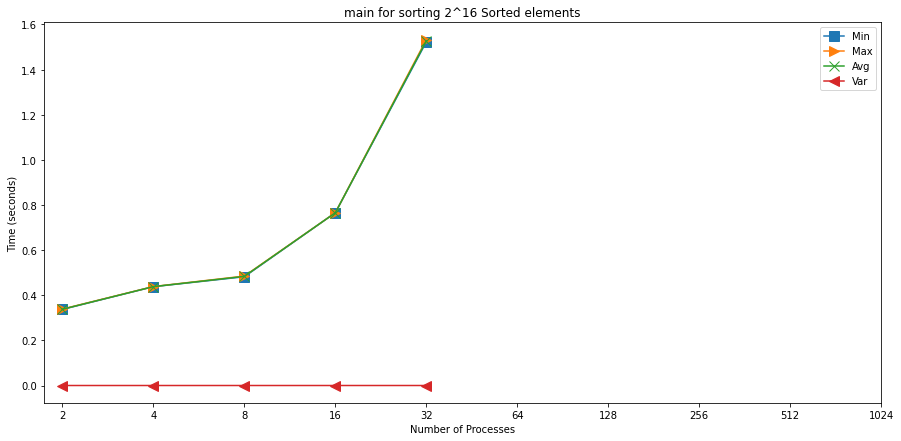

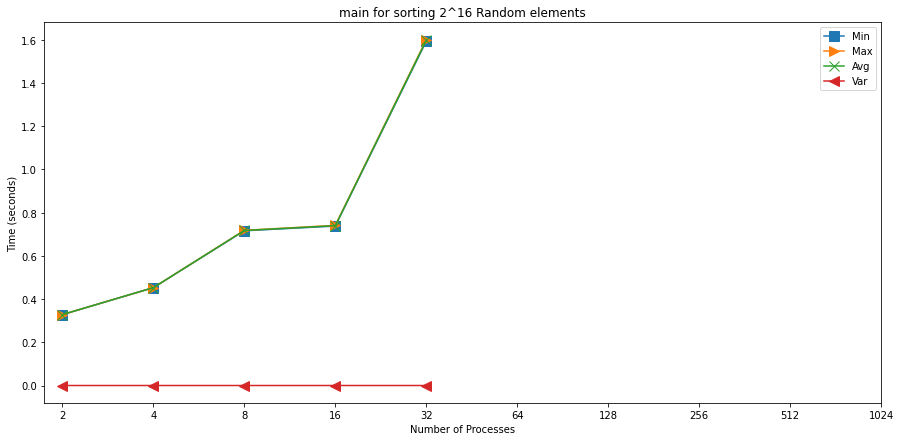

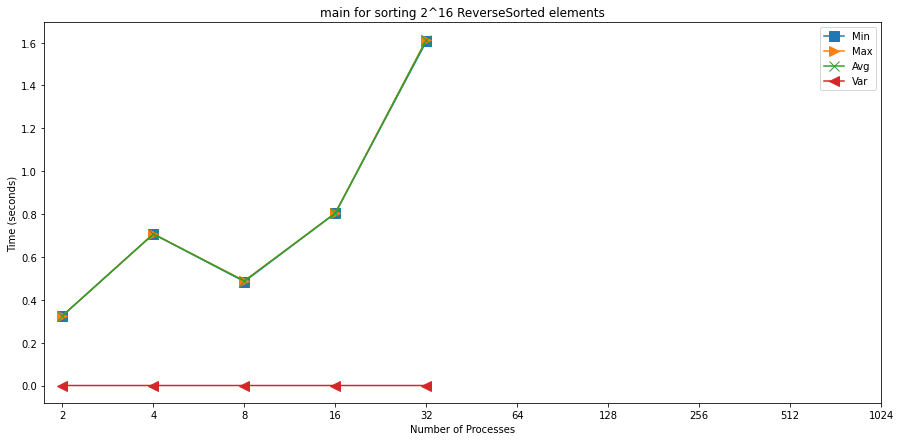

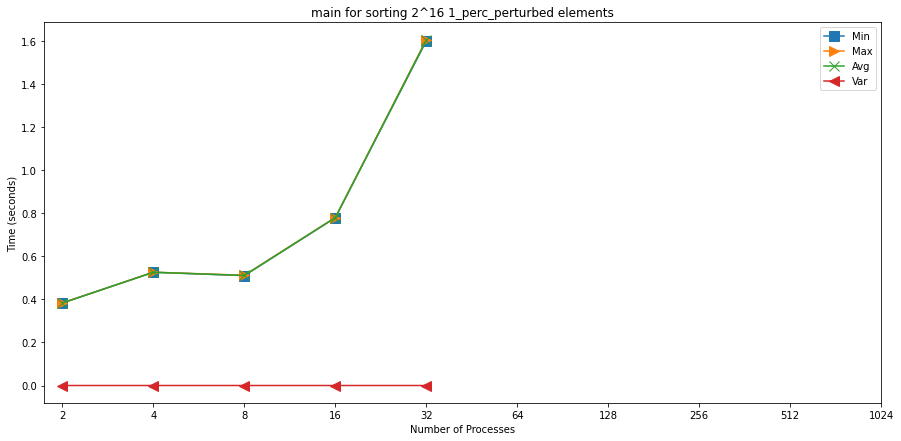

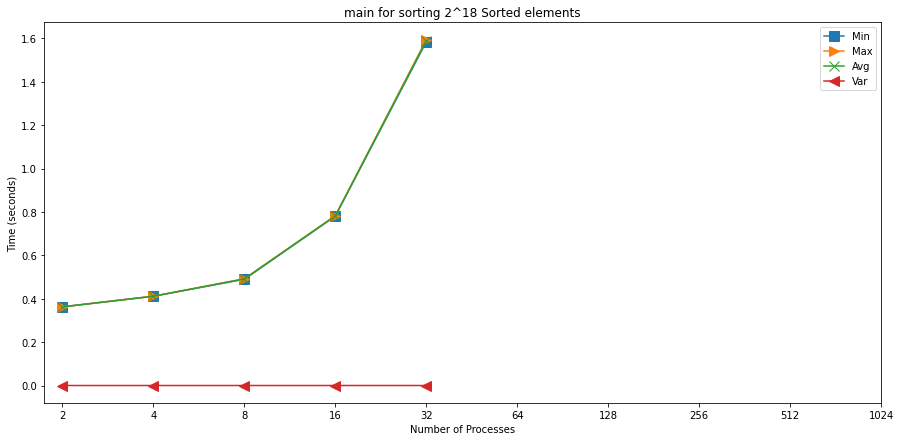

...

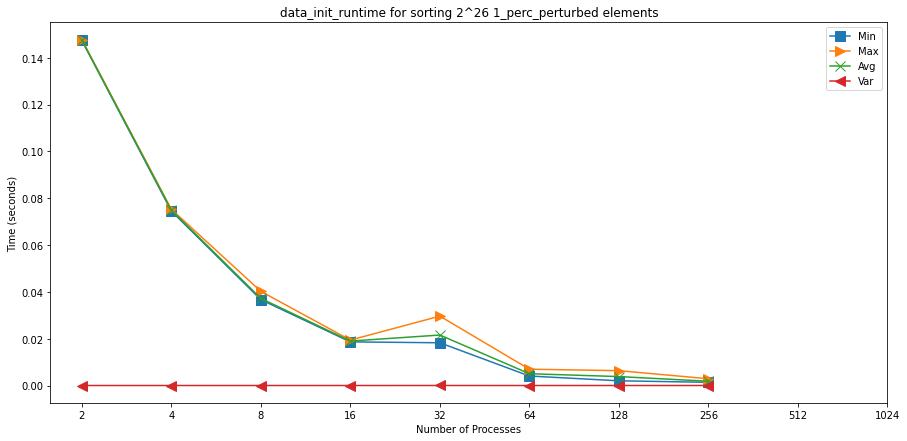

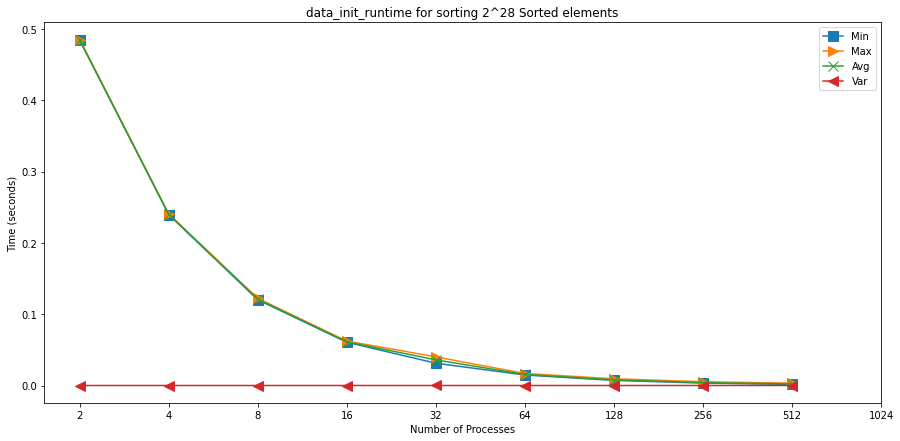

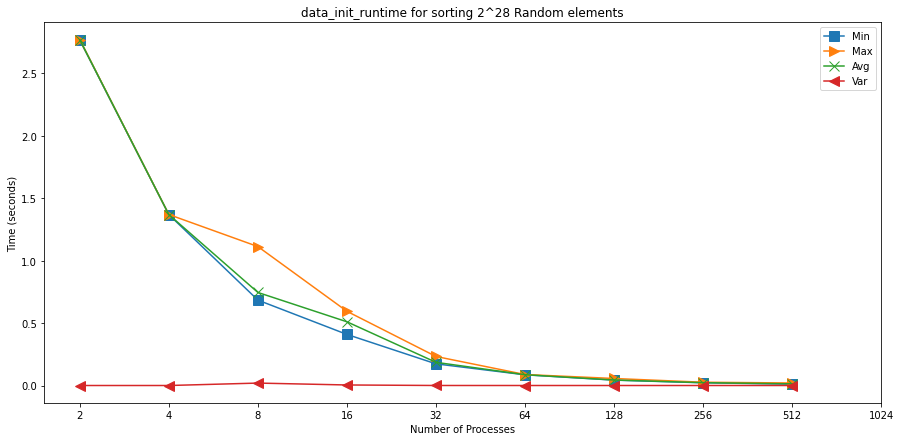

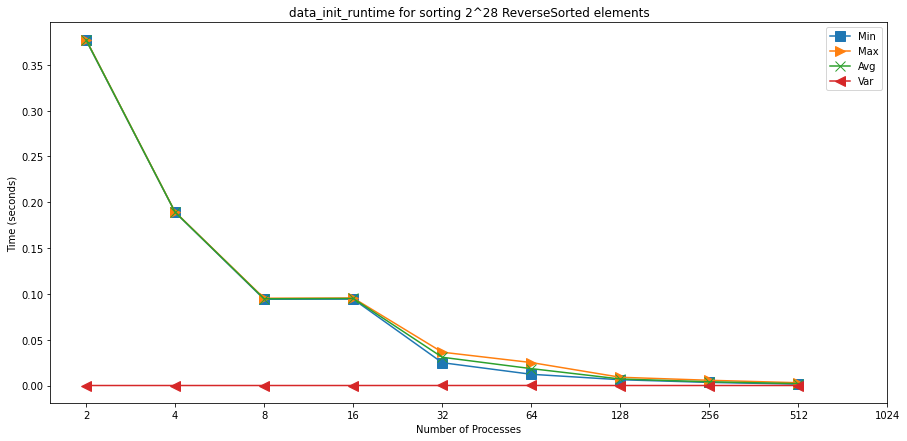

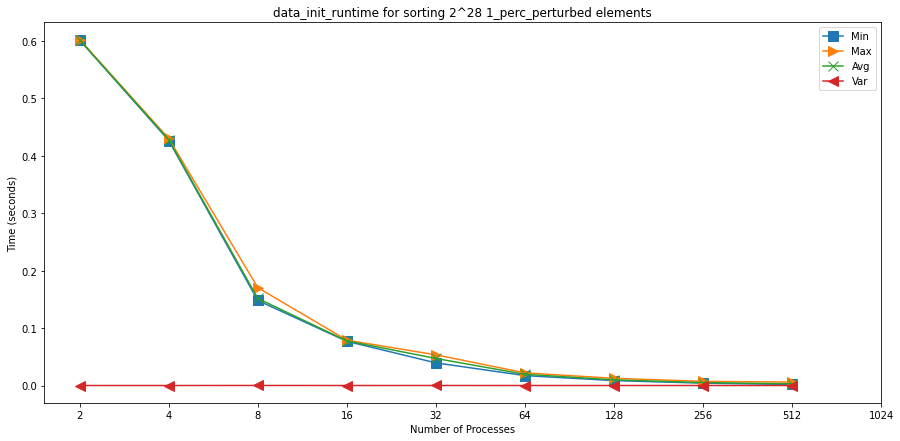

In [69]:
# # print(tk.dataframe.loc[node, "Min time/rank"].unstack(level=["input_size", "input_type"])[size])

# for node in tk.graph.traverse():
#     if node.frame['name'] == 'main' or "MPI" in node.frame['name']:
#     if node.frame['name'] not in plots:
#     if "MPI" in node.frame['name']:
#         continue
    
#     name = node.frame['name']
#     if "data_init_X" in name:
#         name = 'data_init_runtime'
    
#     for exp in exps:
#         size = int(2**exp)
#         for input_type in input_types:
#             plot_mpl(
#                 [
#                     tk.dataframe.loc[node, "Min time/rank"].unstack(level=["input_size", "input_type"])[size][input_type],
#                     tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type],
#                     tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type],
#                     tk.dataframe.loc[node, "Variance time/rank"].unstack(level=["input_size", "input_type"])[size][input_type],
#                 ],
#                 f"{name} for sorting 2^{exp} {input_type} elements", 
#                 "Number of Processes", 
#                 "Time (seconds)",
#                 ["Min", "Max", "Avg", "Var"],
#                 ["s", ">", "x", "<"],
#                 save=True
#             )
#         break
#     break

# for node in tk.graph.traverse():
#     if node.frame['name'] != 'main':
#         continue
#     break

# print(tk.dataframe.loc[node, "Variance time/rank"].unstack(level=["input_size", "input_type"])[int(2**16)])


Plot strong scaling

main
comm
comm


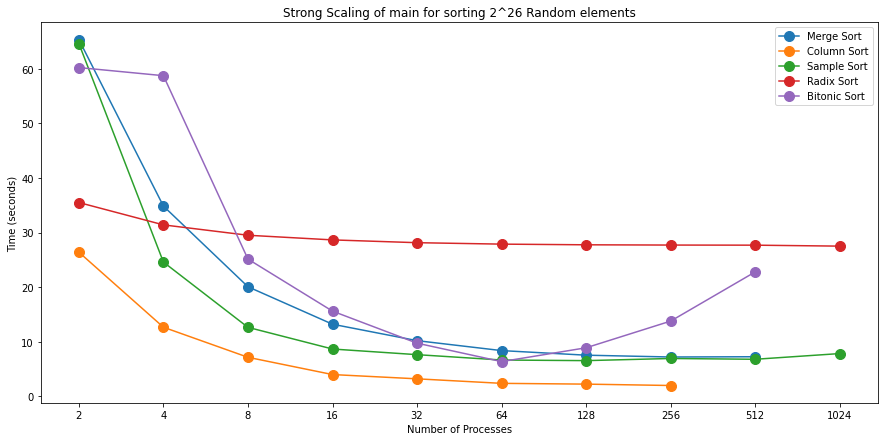

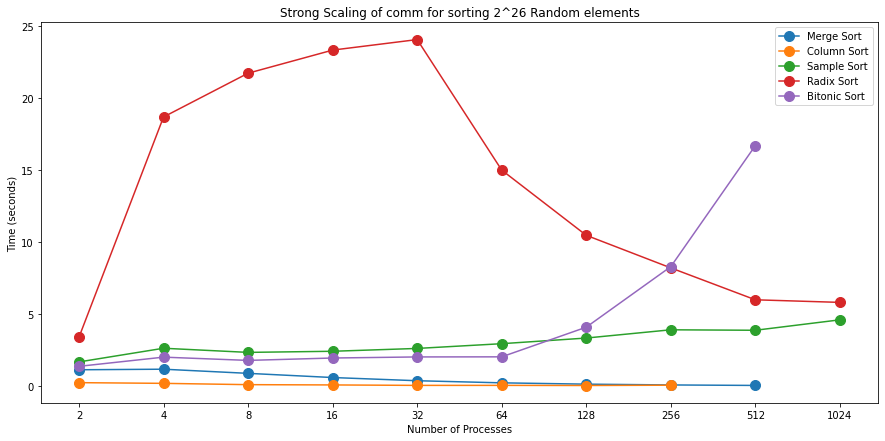

In [75]:
# for node in tk.graph.traverse():
#     if node.frame['name'] not in plots:
#         continue
#     break
# print(tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size]["Sorted"])
# print(tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size]["Sorted"][2])

# for node in tk.graph.traverse():
#     if node.frame['name'] not in plots:
#         continue
#     name = node.frame['name']
#     size = int(2**exp)
#     dfs = []
# #     for algorithm in algorithms:
# # #         print(tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm])
# #         dfs.append(tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm])
    
    
# #     print(size)
# #     print(input_type)
# #     print(name)
# #     print(radix_tk.dataframe.loc[node, "Max time/rank"].unstack(level=["array_size", "array_type"]))
# #     dfs.append(sample_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type.lower()])
# #     dfs.append(radix_tk.dataframe.loc[node, "Max time/rank"].unstack(level=["array_size", "array_type"])[size][input_type])
#     dfs.append(bitonic_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type])
#     print(bitonic_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type])
#     legend = ["Merge Sort", "Column Sort", "Sample Sort", "Radix Sort", "Bitonic Sort"]
#     markers = ['o']*len(dfs)
    
# #     print(bitonic_tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type])
#     if name == "main":
#         plot_mpl(
#             dfs[:-1],
#             f"Strong Scaling of {name} for sorting 2^{exp} {input_type} elements (no Bitonic)",
#             "Number of Processes",
#             "Time (seconds)",
#             legend[:-1],
#             markers[:-1],
#             save=False,
#             saveDir="presentation_plots_scaling"
#         )

#     plot_mpl(
#         dfs,
#         f"Strong Scaling of {name} for sorting 2^{exp} {input_type} elements",
#         "Number of Processes",
#         "Time (seconds)",
#         legend,
#         markers,
#         save=False,
#         saveDir="presentation_plots_scaling"
#     )

from collections import defaultdict

size = int(2**exp)
dfs_all = defaultdict(list)
# for i in range(2):
for node in tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
#     size = int(2**exp)

    for algorithm in algorithms:
#         print(tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm])
        dfs_all[name].append(tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm])

for node in sample_tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
#     size = int(2**exp)

    dfs_all[name].append(sample_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type.lower()])

for node in radix_tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
#     size = int(2**exp)

    dfs_all[name].append(radix_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["array_size", "array_type"])[size][input_type])

for node in bitonic_tk.graph.traverse():
    if node.frame['name'] not in ["whole_computation", "comm"]:
        continue
    name = node.frame['name']
    if name == "whole_computation":
        name = 'main'
    print(name)

#     size = int(2**exp)

    dfs_all[name].append(bitonic_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type])
    
#     dfs_all.append(dfs)
    
name = ["main", "comm"]
legend = ["Merge Sort", "Column Sort", "Sample Sort", "Radix Sort", "Bitonic Sort"]
markers = ['o'] * len(legend)
for i in range(len(dfs_all)):
    dfs = dfs_all[name[i]]
    
    plot_mpl(
        dfs[:len(legend)], # sanity check
        f"Strong Scaling of {name[i]} for sorting 2^{exp} {input_type} elements",
        "Number of Processes",
        "Time (seconds)",
        legend,
        markers,
        save=True,
        saveDir="presentation_plots_scaling"
    )




{'name': 'whole_computation', 'type': 'function'}
{'name': 'comm', 'type': 'function'}
{'name': 'comm', 'type': 'function'}


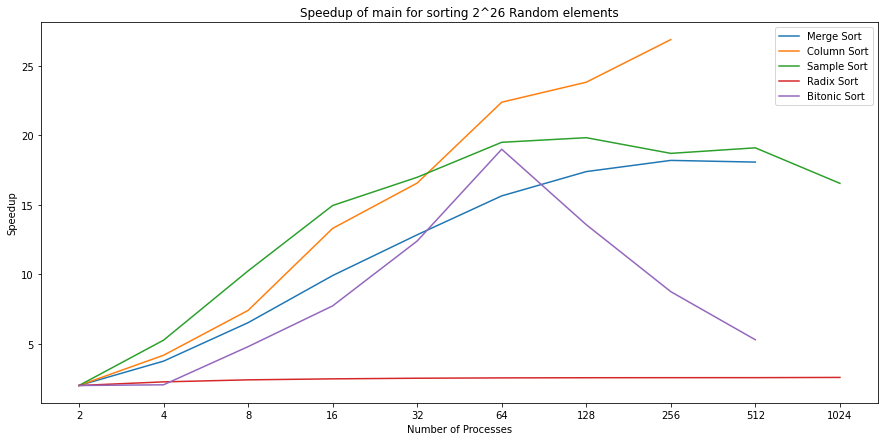

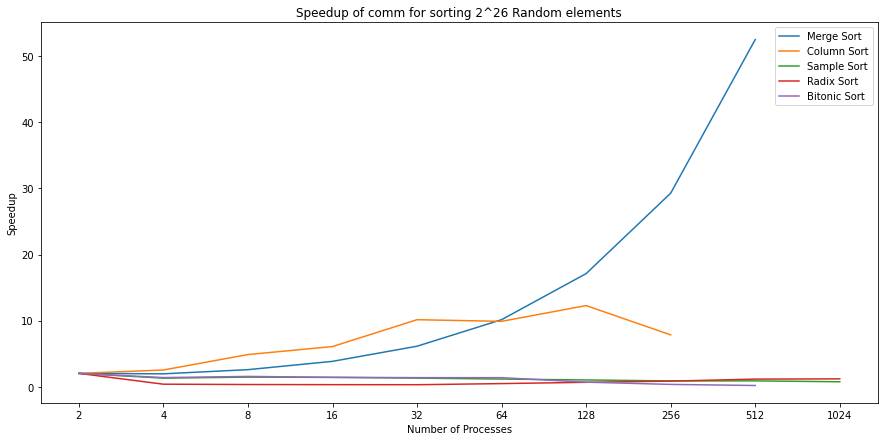

5


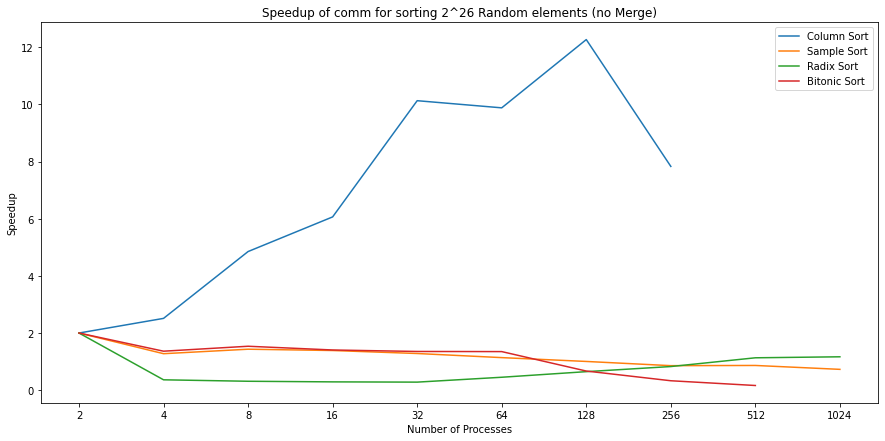

In [76]:

# print(tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[int(2**16)]["Sorted"][1024])
# print(512 in tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[int(2**16)]["Sorted"])


speedup_all = defaultdict(list)
size = int(2**exp)

for node in tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
        
    name = node.frame['name']
    for algorithm in algorithms:
        speedup_per_alg = []
        
        t_1 = (tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm][2]) * 2
        df = tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type", "algorithm"])[size][input_type][algorithm]
        
        for numProcs in processes:
            if numProcs not in df:
                speedup_per_alg.append(None)
                continue
            t_n = df[numProcs]
            speedup_per_alg.append(t_1/t_n)
        
        speedup_all[name].append(speedup_per_alg)

for node in sample_tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
    speedup_per_alg = []
    
    t_1 = (sample_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type.lower()][2]) * 2
    df = sample_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type.lower()]

    for numProcs in processes:
        if numProcs not in df:
            speedup_per_alg.append(None)
            continue
        t_n = df[numProcs]
        speedup_per_alg.append(t_1/t_n)

    speedup_all[name].append(speedup_per_alg)

for node in radix_tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
    speedup_per_alg = []

    t_1 = (radix_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["array_size", "array_type"])[size][input_type][2]) * 2
    df = radix_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["array_size", "array_type"])[size][input_type]

    for numProcs in processes:
        if numProcs not in df:
            speedup_per_alg.append(None)
            continue
        t_n = df[numProcs]
        speedup_per_alg.append(t_1/t_n)

    speedup_all[name].append(speedup_per_alg)

for node in bitonic_tk.graph.traverse():
    if node.frame['name'] not in ["whole_computation", "comm"]:
        continue
    name = node.frame['name']
    if name == 'whole_computation':
        name = 'main'
    speedup_per_alg = []
    print(node)

    t_1 = (bitonic_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type][2]) * 2
    df = bitonic_tk.dataframe.loc[node, "Avg time/rank"].unstack(level=["input_size", "input_type"])[size][input_type]

    for numProcs in processes:
        if numProcs not in df:
            speedup_per_alg.append(None)
            continue
        t_n = df[numProcs]
        speedup_per_alg.append(t_1/t_n)

    speedup_all[name].append(speedup_per_alg)

legend = ["Merge Sort", "Column Sort", "Sample Sort", "Radix Sort", "Bitonic Sort"]
markers = ["o"] * len(legend)
name = ['main', 'comm']

for i in range(len(speedup_all)):
    speedup = speedup_all[name[i]]
    plot_mpl_notdf(
        processes,
        speedup[:len(legend)],
        f"Speedup of {name[i]} for sorting 2^{exp} {input_type} elements", 
        "Number of Processes", 
        "Speedup",
        legend,
        markers,
        save=True,
        saveDir="presentation_plots_scaling"
    )
    
    if name[i] == "comm":
        print(len(speedup[1:]))
        plot_mpl_notdf(
            processes,
            speedup[1:len(legend)],
            f"Speedup of {name[i]} for sorting 2^{exp} {input_type} elements (no Merge)", 
            "Number of Processes", 
            "Speedup",
            legend[1:],
            markers[1:],
            save=True,
            saveDir="presentation_plots_scaling"
        )




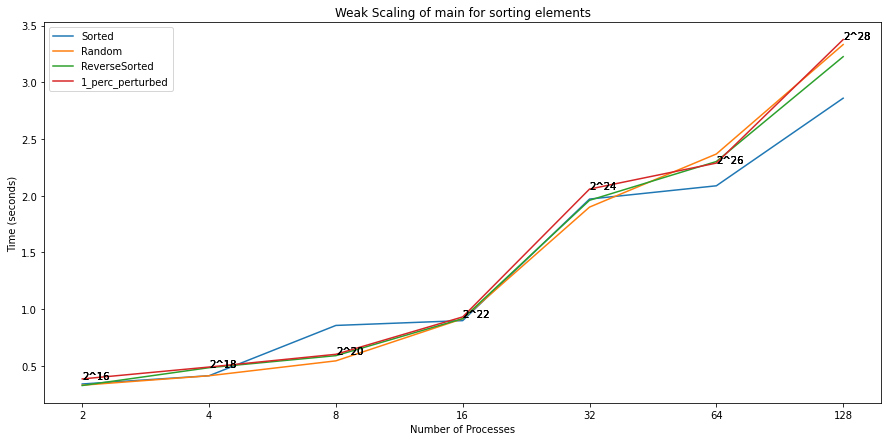

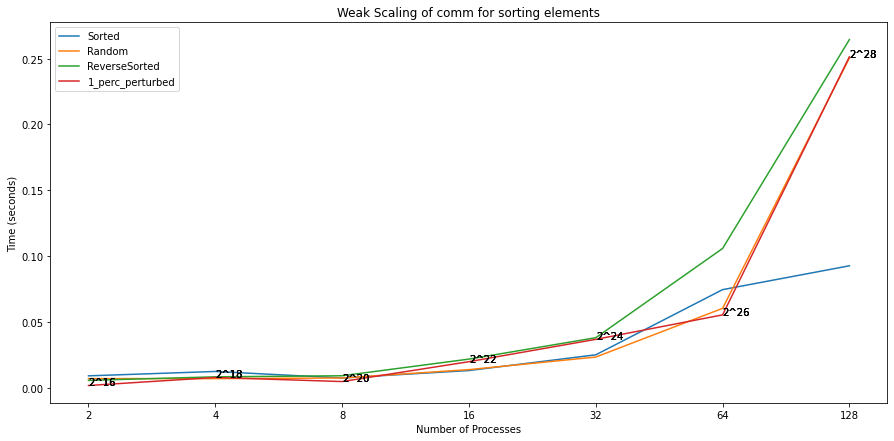

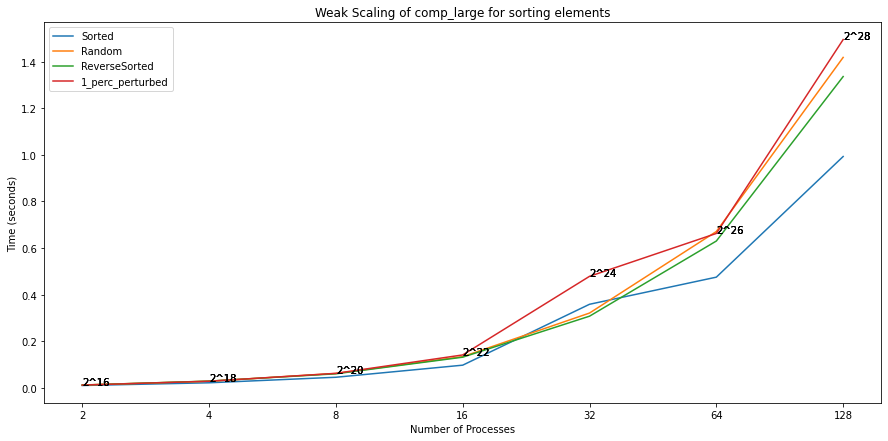

In [61]:
for node in tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
    times = []
    sizes = []
    legend = []
    for input_type in input_types:
        numProcs = 2
        times_per_type = []
        sizes_per_type = []
        for exp in exps:
            size = int(2**exp)
            sizes_per_type.append(f"2^{exp}")
            time = tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type][numProcs]
            numProcs = int(numProcs * 2)
            times_per_type.append(time)
        
        sizes.append(sizes_per_type)
        times.append(times_per_type)    
        legend.append(f"{input_type}")
    
    markers = ["o"] * len(input_types)
    plot_mpl_notdf(
        processes[:len(exps)],
        times,
        f"Weak Scaling of {name} for sorting elements",
        "Number of Processes", 
        "Time (seconds)",
        legend,
        markers,
        save=save,
        saveDir="plots_scaling",
        annotations=sizes
    )



In [ ]:
for node in tk.graph.traverse():
    if node.frame['name'] not in plots:
        continue
    name = node.frame['name']
    for input_type in input_types:
        efficiency = []
        procs = []
        t_2 = tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type][2]
        numProcs = 2
        for exp in exps:
            procs.append(numProcs)
            size = int(2**exp)
            sizes.append(size)
            time = tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type][numProcs]
            numProcs = int(numProcs * 2)
            times.append(time)
        for numProcs in processes:
            if numProcs == 1024:
                break
            t_n = tk.dataframe.loc[node, "Max time/rank"].unstack(level=["input_size", "input_type"])[size][input_type][numProcs]
            efficiency.append(t_2/t_n)
            procs.append(numProcs)
        plot_mpl_notdf(
            procs,
            speedup,
            f"Weak Scaling Efficiency of {name} for sorting 2^28 {input_type} elements", 
            "Number of Processes", 
            "Efficiency",
            ["Efficiency"],
            ["o"],
        )